In [1]:
import  numpy as np
import matplotlib.pyplot as plt
import cv2 as cv

In [3]:
def show(img):
    if img.ndim ==2:
        plt.imshow(img,cmap="gray")
    else:
        plt.imshow(cv.cvtColor(img,cv.COLOR_BGR2RGB))
    plt.show()

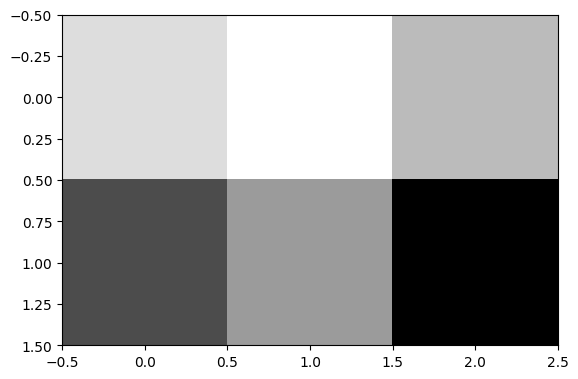

(array([[125, 139, 111],
        [ 66,  98,  35]]),
 None)

In [7]:
x = np.random.randint(0,256,(2,3))
x,show(x)

# 图像几何变换
# 1.图像的裁剪、放大、缩小

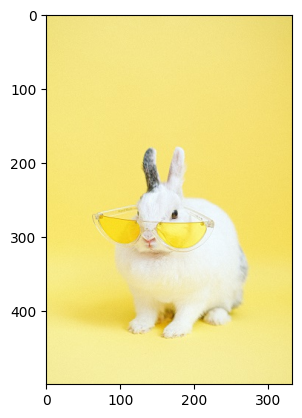

In [8]:
img = cv.imread("pic/rabbit500x333.jpg")
show(img)

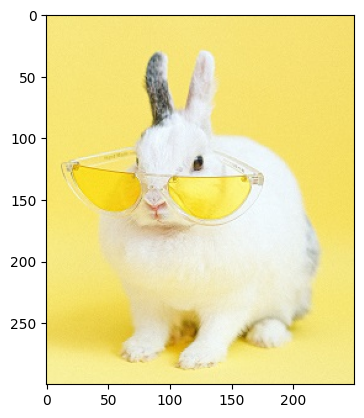

In [9]:
#图像的裁剪
rabbit = img[150:450,50:300,:]#最后一个维度为通道，：为选中所有三个通道
show(rabbit)

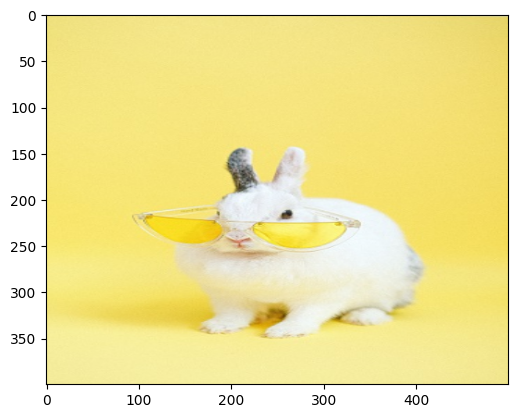

In [10]:
#图像的放大缩小
#opencv 先x后y
img2 = cv.resize(img,(500,400))
show(img2)

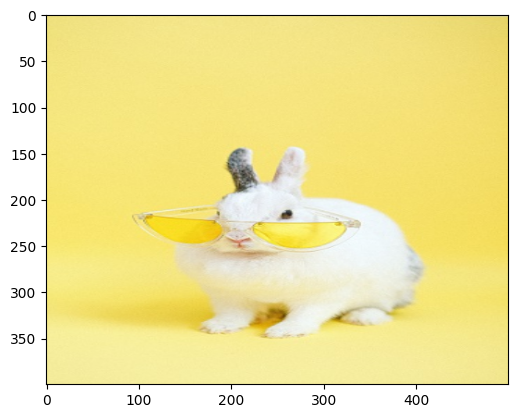

In [11]:
#插值
img3 = cv.resize(img,(500,400),interpolation=cv.INTER_LINEAR)#线性插值
show(img3)

- 插值选择
    - 放大：cv.INTER_LINEAR
    - 缩小：cv.INTER_AREA


# 2.平移变换
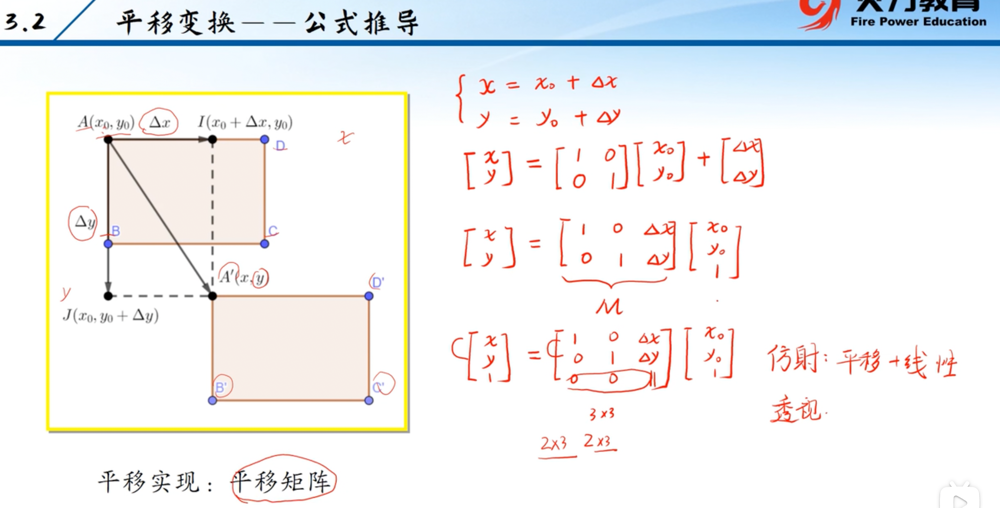

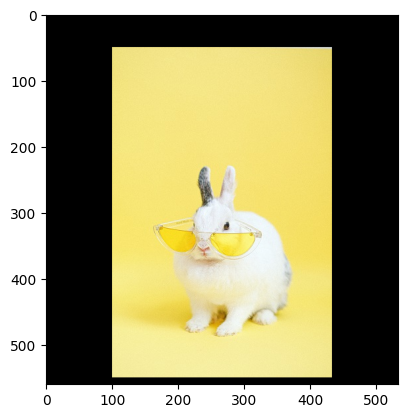

In [31]:
#向右平移100像素，向下平移50像素 另外注意dtype设为np.float32
M = np.array([[1,0,100],[0,1,50]],dtype=np.float32)  
img1 = cv.warpAffine(img,M,(533,560)) #affine仿射
show(img1)

# 3.错切变换
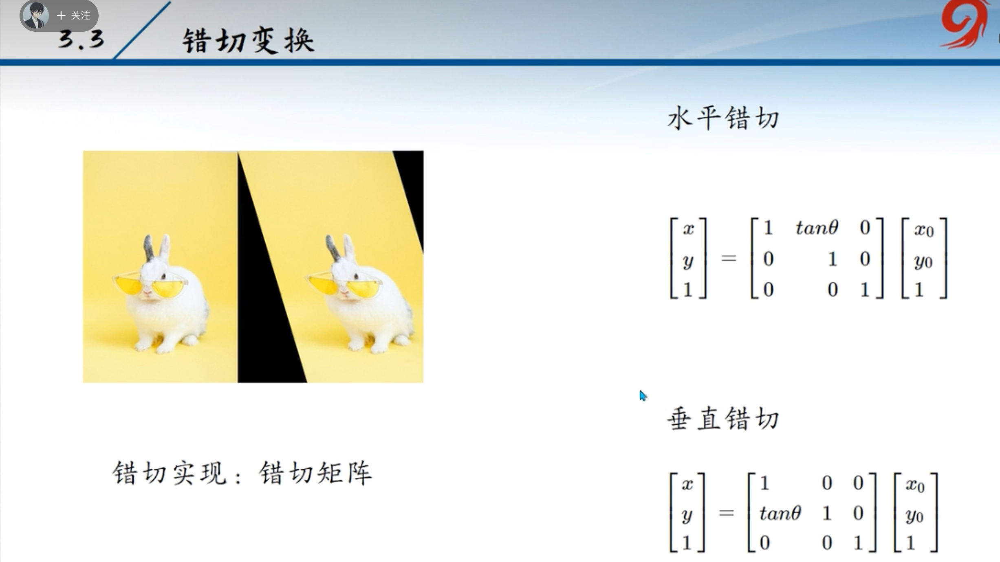

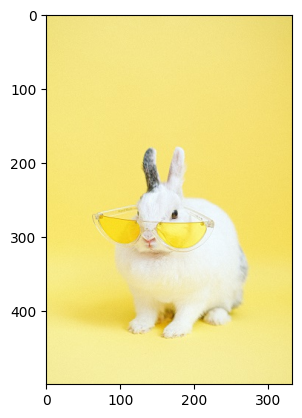

In [20]:
show(img)

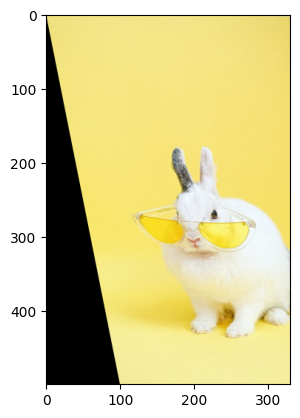

In [26]:
M = np.array([[1,0.2,0],[0,1,0]])
img2 = cv.warpAffine(img,M,(330,500))
show(img2)

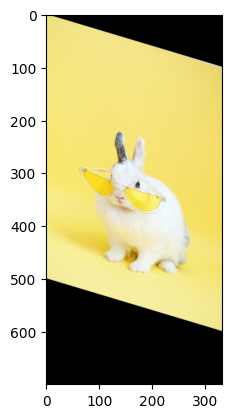

In [28]:
M = np.array([[1,0,0],[0.3,1,0]])
img3 = cv.warpAffine(img,M,(333,700))
show(img3)

# 4.镜像变换
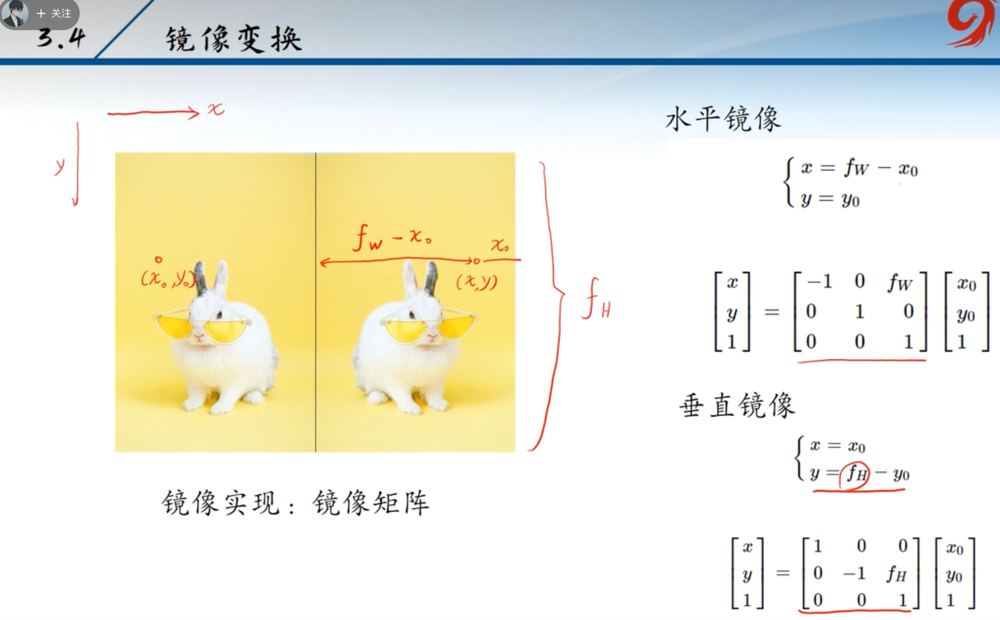

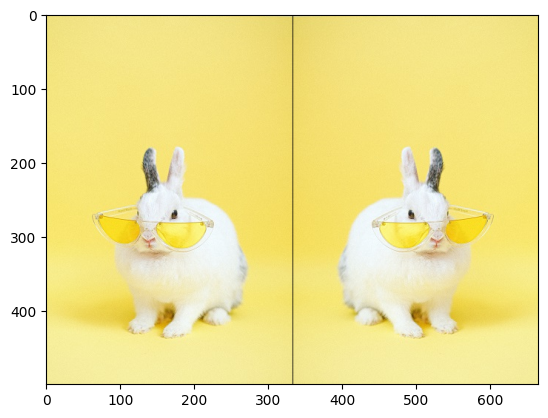

In [37]:
#水平翻转
Mx = np.array(
[
[-1,0,333],
[0,1,0]
],dtype=np.float32
)

img2 = cv.warpAffine(img,Mx,(333,500))
show(np.hstack([img,img2]))

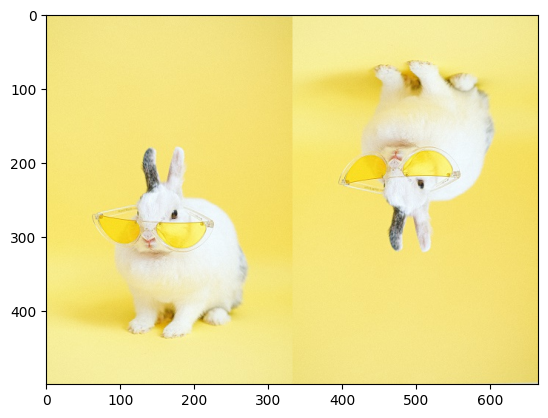

In [40]:
#垂直翻转
My = np.array([
[1,0,0],
[0,-1,500]
],dtype=np.float32)
img3 = cv.warpAffine(img,My,(333,500))
show(np.hstack([img,img3]))

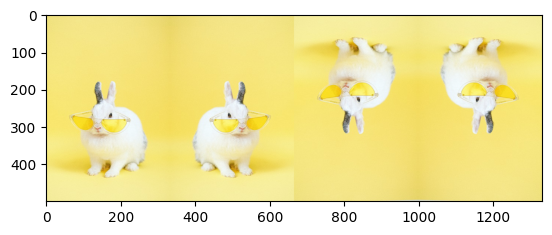

In [43]:
#使用函数实现水平、垂直翻转
img1 = cv.flip(img,1) #垂直翻转
img2 = cv.flip(img,0) #水平翻转
img3 = cv.flip(img,-1) #水平垂直同时进行
show(np.hstack([img,img1,img2,img3]))


- 可以用cv.flip做数据增强

# 5.旋转变换
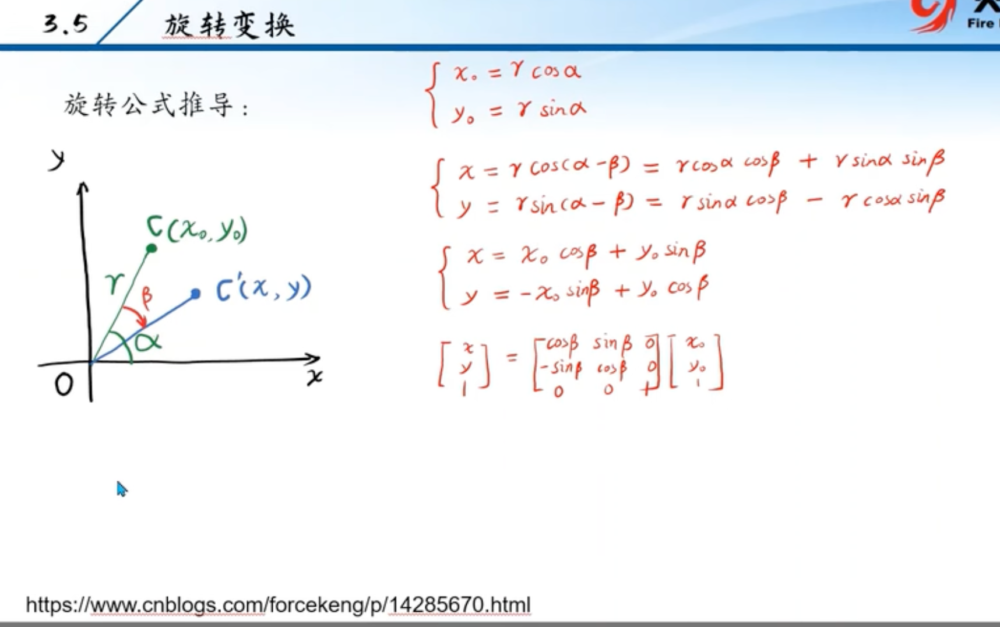

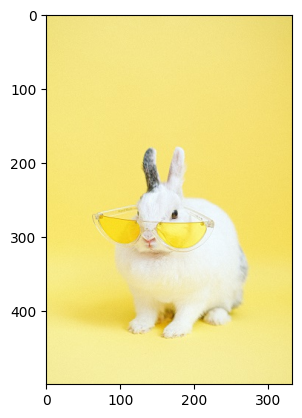

In [46]:
show(img)

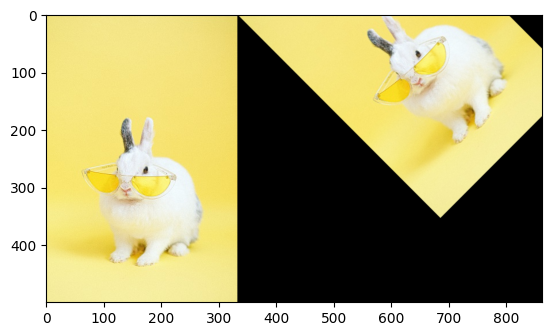

In [50]:
beta = np.pi/4
M = np.array(
[[np.cos(beta),np.sin(beta),0],
[-np.sin(beta),np.cos(beta),0]],dtype=np.float32
)

img1 = cv.warpAffine(img,M,(530,500))
show(np.hstack([img,img1]))

In [53]:
#旋转 函数实现
h,w,c = img.shape
h,w,c

(500, 333, 3)

In [54]:
M2 = cv.getRotationMatrix2D((w//2,h//2),45,1) #三个参数分别为：center,angle,scale 中心点坐标，角度，比例
M2

array([[   0.70710678,    0.70710678, -128.15642097],
       [  -0.70710678,    0.70710678,  190.60303038]])

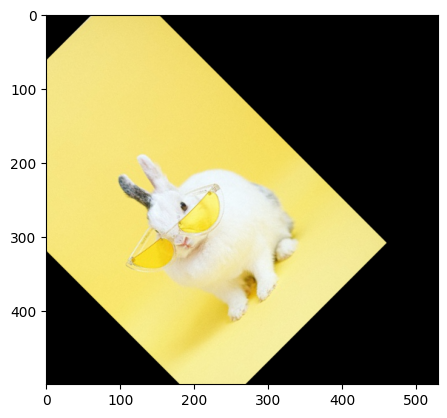

In [57]:
img3 = cv.warpAffine(img,M2,(530,500))
show(img3)

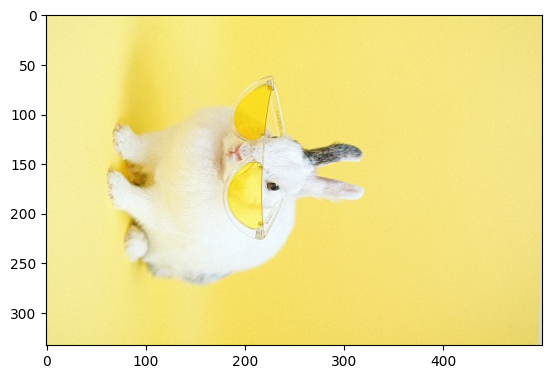

In [62]:
#cv.rotate函数 只有3种角度：顺时针90，逆时针90，180
img4 = cv.rotate(img,cv.ROTATE_90_CLOCKWISE)
show(img4)

# 6.透视变换
- 应用
    - 车道检测
    - 图片矫正

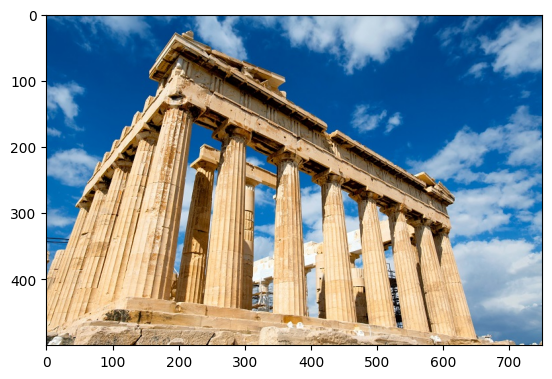

In [64]:
img = cv.imread("pic/parthenon500x750.jpg")
show(img)

In [66]:
src = np.array(
[[195,20],
 [615,280],
 [175,430],
[650,485]
],dtype=np.float32)

dst = np.array(
[
[195,280],
[615,280],
    [195,485],
    [615,485]
    
],dtype=np.float32)

M=cv.getPerspectiveTransform(src,dst)
M



array([[ 1.34616477e-01,  9.49549270e-02,  1.23092839e+02],
       [-6.22428901e-01,  5.77275491e-01,  3.26996342e+02],
       [-1.19129464e-03,  3.95161244e-04,  1.00000000e+00]])

In [68]:
src = np.array([
    [210, 50],
    [610, 270],
    [650, 470],
    [150, 450]
], dtype=np.float32)

dst = np.array([
   [150, 50],
   [650, 50],
   [650, 470],
   [150, 470]
], dtype=np.float32)

M=cv.getPerspectiveTransform(src,dst)
M

array([[ 2.42579996e-01,  1.48606482e-01,  5.57711218e+01],
       [-6.29159000e-01,  1.05624991e+00,  1.17358643e+02],
       [-1.27104151e-03,  5.57473657e-04,  1.00000000e+00]])

In [69]:
h,w,c = img.shape

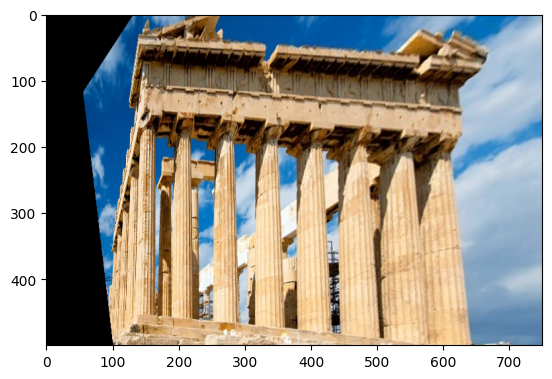

In [70]:
img2 = cv.warpPerspective(img,M,(w,h))
show(img2)

# 7.最近邻插值和双线性插值原理
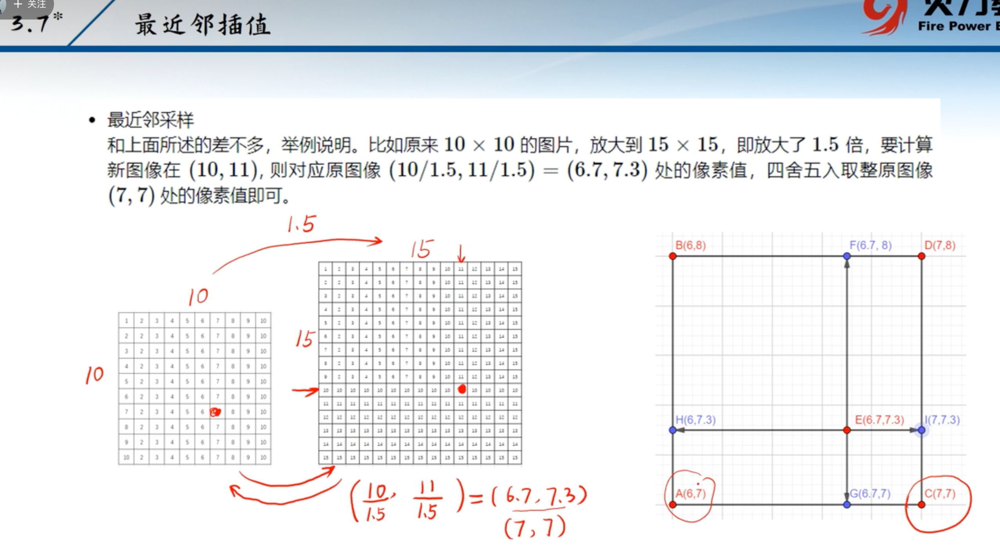
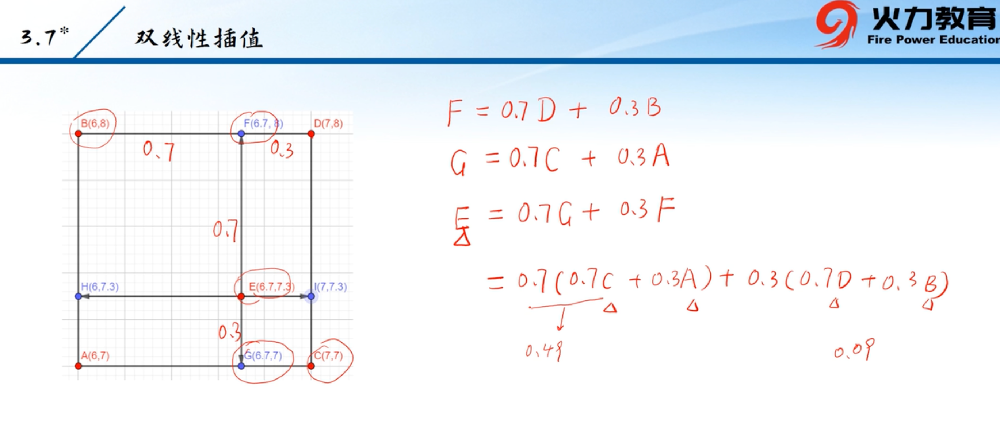

# 8.插值的比较

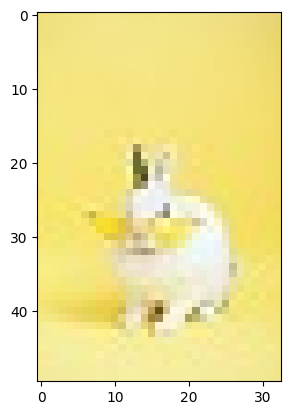

In [73]:
img = cv.imread("pic/rabbit50x33.jpg")
show(img)

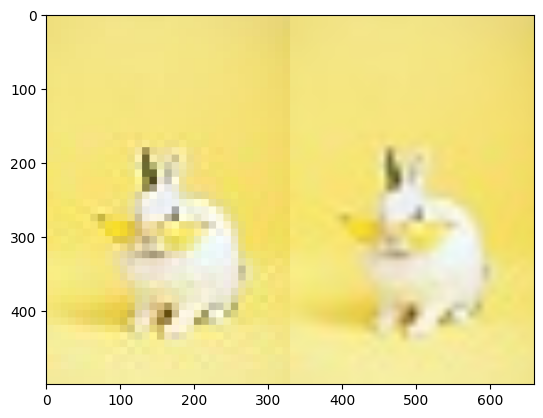

In [77]:
img1 = cv.resize(img,(330,500),interpolation=cv.INTER_NEAREST)
img2 = cv.resize(img,(330,500),interpolation=cv.INTER_LINEAR_EXACT) #加了EXACT，则为未经过优化的
show(np.hstack([img1,img2]))
